# Calibration TimePix

In [1]:
import numpy as np
import matplotlib.pyplot as plt

data = np.loadtxt("C:\\Users\\admin\\Desktop\\200kV_parallel_beam_low_current.t3pa",skiprows=1).transpose()[3]

['.\\results\\100 s_open_1.5-2.5 eV_60 m_visible_profile.npz', '.\\results\\100 s_open_2.5-3.5 eV_60 m_visible_profile.npz']


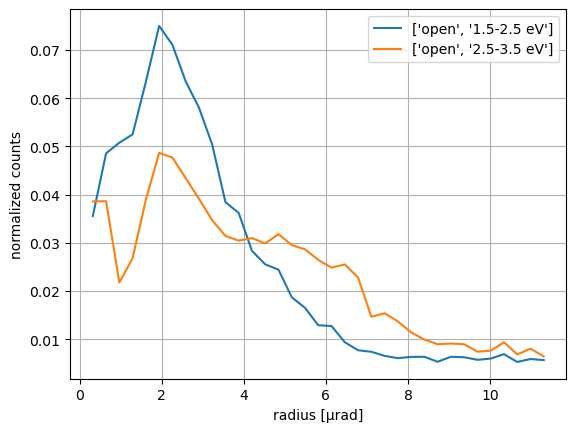

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
from pathlib import Path

files = [os.path.join(".\\results\\",x) for x in os.listdir(".\\results")]
print(files)

for i in files:
    data = np.load(i)
    profile = np.sum(data['coinprofile'],axis=0)
    plt.plot(data['coinedge'][:-25]*0.1615,profile[:-24]/np.sum(profile),label=Path(i).name.split('_')[1:3])
plt.xlabel('radius [µrad]')
plt.ylabel('normalized counts')
plt.legend()
plt.grid(True)
plt.show()

# ToA Callibration

In [25]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 
from pathlib import Path
from sklearn.cluster import DBSCAN
import time
import pandas as pd
import os

def Rep_Func_default(class_arr):
                info = []

                columns = ['x','y','toa','tot','label']
                df = pd.DataFrame(class_arr,columns = columns)
                suitable_events = df[df['label']!=-1]
                rougue_events = df[df['label']==-1]

                cond = (suitable_events.groupby('label').sum()['tot'] > totlim)

                sex = suitable_events.groupby('label').min()[cond]['x']
                sey = suitable_events.groupby('label').min()[cond]['y']
                setoa = suitable_events.groupby('label').min()[cond]['toa']
                setot = suitable_events.groupby('label').sum()[cond]['tot']

                se = pd.concat([sex,sey,setoa,setot],axis = 1)
                re = (rougue_events[rougue_events['tot'] > totlim]).drop('label',axis =1)
                rep_arr = pd.concat([se,re],axis = 0)
                return rep_arr, info

def clustering(data, 
            label_offset = 0, 
            data_handler = None,
            eps= 2, 
            split = 1,
            make_rep = True, 
            Rep_Func = Rep_Func_default, 
            timeRecalibrationFactor = 1 / 300000, 
            normalize_t = 1 , 
            e0_toa = 0):
    
    min_samples = 2
    n_jobs = 1 # n_jobs determines cpu-cure utilization (-1 uses all cores)
    
    start = time.time()
    # Cluster
    chunks = np.array_split(data, split,axis = 1)
    l_off = label_offset
    class_arr = np.zeros(5)
    for i,chunk in enumerate(chunks):
        
        # Sort by ToA, then normalize ToAs
        index = chunk[1,:].argsort()
        matrixID = chunk[0,:][index]
        timesoA = (chunk[1,:][index]*normalize_t - e0_toa)
        timesoT = chunk[2,:][index]
        
        # prepare individual coordinate arrays
        # tCoordinates normlized for clustering, for all other purposes use timesoA
        xCoordinates = (matrixID / 256).astype(int)
        yCoordinates = (matrixID % 256).astype(int)
        tCoordinates = timesoA * timeRecalibrationFactor 
        events = np.array(list(zip(xCoordinates,yCoordinates,tCoordinates)))

        # Apply Clustering
        # n_jobs determines cpu-cure utilization (-1 uses all cores)
        labels = DBSCAN(eps=eps,min_samples=min_samples,n_jobs=n_jobs).fit_predict(events)
        labels += l_off + 1
        labels[labels == l_off] = -1
        l_off = labels.max()    

        # create list of events with their classification (full data, but classified into clusters)
        classifiedEvents = np.array(list(zip(xCoordinates,yCoordinates,timesoA,timesoT,labels)))
        if data_handler:
            data_handler.save_class_data(matrixID,timesoA,timesoT,labels)

        # GENERATE BASIC DATA ABOUT LABELS
        class_arr = np.vstack([class_arr, classifiedEvents])
    class_arr = class_arr[1:,:]
    end = time.time()
    # print(end - start)

    if make_rep:
        rep_arr, info = Rep_Func(class_arr)
        if data_handler:
            data_handler.save_rep_data(np.array(rep_arr['x']*256 + rep_arr['y']),np.array(rep_arr['toa']),np.array(rep_arr['tot']))
    return class_arr, rep_arr


process_path = "C:\\Users\\admin\\Desktop\\good datasets\\1000 s_600 nm shortpass_1.5-6.5 eV_81 m_visible"
target_format = '.npz'
delta = 500 * int(1e4)
binning = 1.5 * int(1e4)
cluster = True
timeRecalibrationFactor = 2e-06
offset = -20 * int(1e4)
lower = -100 * int(1e4)
upper = 100 * int(1e4)

# Initialize an empty list to store the matching file paths
process_list = []

# Walk through the directory tree and find files with the specified format
for root, _, files in os.walk(process_path):
        for filename in files:
                if filename.endswith(target_format):
                        process_list.append(os.path.join(root, filename))

folder_list = [os.path.join(process_path, f) for f in os.listdir(process_path) if os.path.isdir(os.path.join(process_path, f))]
folder_number = [f for f in os.listdir(process_path) if os.path.isdir(os.path.join(process_path, f))]

global photon_offsets

photon_offsets = np.zeros((len(folder_number),))

for folder in folder_list:
        package = os.path.join(folder, 'data')
        package_number = int(Path(folder).name)-1
        data_list = sorted([os.path.join(package, f) for f in os.listdir(package) if f.endswith('.npz')], key=os.path.getmtime)
        temp = 1
        for data in data_list:
                try:
                    package = np.load(data, mmap_mode='r')
                    begin = Path(data).name
                    begin_time = float(begin.split('-')[0]+'-'+begin.split('-')[1])
                    photon_offsets[package_number] = 0
                    if photon_offsets[package_number] == 0 or begin_time < temp:
                            photon_offsets[package_number] = package['trigger'][0]
                            print(r'Photon offset corrected: {} ns in package {}'.format(photon_offsets[package_number]/1e4,package_number+1))
                            temp = begin_time
                except Exception as e:
                    pass 

bins = 100
delta = 500 * int(1e4)
binning = 5 * int(1e4)
bin= int(delta*2/binning)
bins = np.linspace(-delta, delta, bin+1)
pixel_hist = np.zeros((256*256,bins.shape[0]-1))
             
for i in process_list:
    file_path = i
    data = np.load(file_path)

    bin= int(delta*2/binning)
    bins = np.linspace(-delta, delta, bin+1)
    hist = np.zeros(bin)

    photon_offset = photon_offsets[int(Path(i).parent.parent.name)-1]
    print(photon_offset)

    totlim = 25

    try:
        arr1 = data['photons1']
        if arr1.shape[0] > 0:
            arr1=arr1-photon_offset
            arr1*=10
            #print(arr1)
    except Exception as e:
            print(e)

    arr2 = data['photons2']
    if arr2.shape[0]>0:
        arr2=arr2-photon_offset
        arr2*=10
        #print(arr2)
    arr = np.concatenate((arr1, arr2))
    photons = np.sort(arr[arr>0])

    print(Path(file_path).name)

    if cluster == True:
        print("Clustered data is generated")

        electrons_sort = np.argsort(data['toas'])

        electrons_toa = data['toas'][electrons_sort]*15625
        electrons_tot = data['tots'][electrons_sort]*25
        electrons_xy = data['addresses'][electrons_sort]

        print('Number of electron events: {}'.format(electrons_toa.shape[0]))
        print('Number of photon events: {}'.format(photons.shape[0]))

        data_cluster =np.vstack([electrons_xy, electrons_toa, electrons_tot])

        class_arr, rep_arr = clustering(data_cluster,
                                        #label_offset = l_off,
                                        split = 1,
                                        eps = 3,
                                        timeRecalibrationFactor = timeRecalibrationFactor,
                                        normalize_t = 1)
        #l_off = int(class_arr[:,4])
        electrons_toa = np.array(rep_arr['toa'])
        electrons_tot = np.array(rep_arr['tot'])
        electrons_xy = np.array(rep_arr['x'])*256 + np.array(rep_arr['y'])

        electrons_sort=np.argsort(electrons_toa)

        electrons_toa = electrons_toa[electrons_sort]
        electrons_tot = electrons_tot[electrons_sort]
        electrons_xy = electrons_xy[electrons_sort]

        np.savez(file_path,addresses=data['addresses'], toas=data['toas'], tots=data['tots'], photons1=data['photons1'], photons2=data['photons2'], trigger=data['trigger'],clustered_toa=electrons_toa,clustered_tot=electrons_tot,clustered_xy=electrons_xy)

        print('Number of clustered electron events: {}'.format(electrons_toa.shape[0]))


            ############################################################

    # Coincidences
    i,j = 0,0
    coins = np.empty((0,))
    off = np.empty((0,))

    while (i<electrons_toa.shape[0]-10) and (j<photons.shape[0]-10):
        diff = electrons_toa[i] - photons[j] - offset
        if diff > lower and diff < upper:
            coins = np.append(coins,i)
            off = np.append(off,diff)
            #print(diff, lower, upper)
            i += 1
            j += 1
        elif diff >= upper:
            j += 1
        else:
            i += 1

    print('Found {} coincidences at {} ns offset'.format(coins.shape[0],offset/1e4))

    # Pixel delay map
    # Define model function to be used to fit to the data above:
    def gauss(x, *p):
        A, mu, sigma = p
        return A*np.exp(-(x-mu)**2/(2.*sigma**2))

    try:
        pixel = electrons_xy[coins.astype(int)]
        time_map = np.zeros((0,))
        i, j = np.unique(pixel,return_counts=True)

        for j in i:
            delay_hist, delay_edges = np.histogram(off[pixel == j],bins=bins)
            pixel_hist[int(j)] = pixel_hist[int(j)]+delay_hist
            print("Pixel {} done".format(j))
    except Exception as e: print(e)
print(pixel_hist)



Photon offset corrected: 96838650.8358 ns in package 1
Photon offset corrected: 89907276.5926 ns in package 2
Photon offset corrected: 91161196.8044 ns in package 3
Photon offset corrected: 89513934.9136 ns in package 4
Photon offset corrected: 91294416.9707 ns in package 5
Photon offset corrected: 96694534.0697 ns in package 6
Photon offset corrected: 88598168.0983 ns in package 7
Photon offset corrected: 89870912.1114 ns in package 8
Photon offset corrected: 90691886.4913 ns in package 9
968386508358.0
0.539639028125-1.087849628125.npz
Clustered data is generated
Number of electron events: 645120
Number of photon events: 2101
Number of clustered electron events: 435735
Found 389 coincidences at -20.0 ns offset
Pixel 695.0 done
Pixel 1157.0 done
Pixel 1733.0 done
Pixel 1920.0 done
Pixel 2725.0 done
Pixel 3248.0 done
Pixel 5730.0 done
Pixel 6070.0 done
Pixel 6511.0 done
Pixel 6542.0 done
Pixel 7023.0 done
Pixel 7051.0 done
Pixel 7063.0 done
Pixel 7510.0 done
Pixel 7606.0 done
Pixel 937

KeyboardInterrupt: 

[ 6.86950293e-01 -1.08587523e+05  5.86563781e+05]


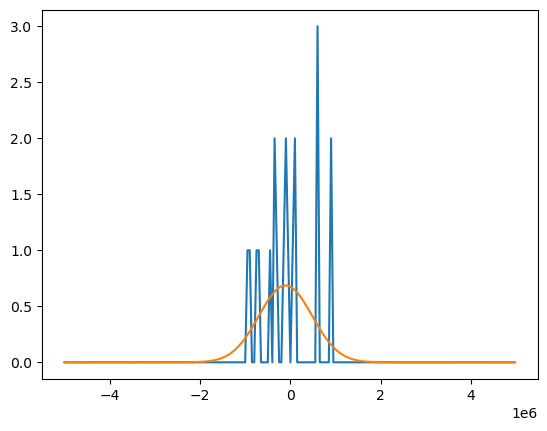

In [26]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

pix = pixel_hist[38763]
plt.plot(delay_edges[:-1],pix)

delay_centre = (delay_edges[:-1] + delay_edges[1:])/2
# p0 is the initial guess for the fitting coefficients (A, mu and sigma above)
mean = 0
sigma = 1e6

p0 = [np.max(pix), mean, sigma]

def gauss(x, *p):
    A, mu, sigma = p
    return A*np.exp(-(x-mu)**2/(2.*sigma**2))

coeff, var_matrix = curve_fit(gauss, delay_centre, pix, p0=p0)
print(coeff)

# Get the fitted curve
hist_fit = gauss(delay_centre, *coeff)

plt.plot(delay_centre,hist_fit)
plt.show()

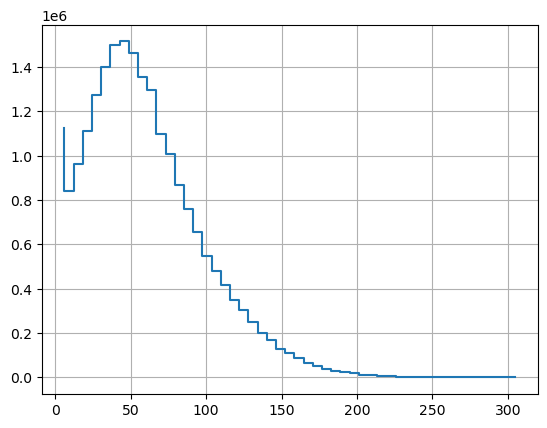

In [20]:
import os
import numpy as np
import matplotlib.pyplot as plt

process_path = 'C:\\Users\\admin\\Desktop\\good datasets\\100 s_600 nm shortpass_1.5-2.5 eV_81 m_visible\\1\\data\\'

hist = np.zeros(50)
xrange = range(120,131)
yrange = range(119,131)
# matrix_list = np.array([i*256 + j for i in xrange for j in yrange])
matrix_list =  []
min_tot = 0

for path in os.listdir(process_path):
    data = np.load(process_path+path)
    tot = data['tots']
    id = np.isin(data['addresses'],matrix_list)
    tot[id]=0
    _,edge = np.histogram(tot[tot > min_tot],bins=50)
    hist += _

plt.grid(True)
plt.plot(edge[:-1],hist,drawstyle= 'steps-pre')
plt.show()